#**Code Challenge: Object Recognition**
Task is to implement an object recognition pipeline using a pre-trained model and evaluate its performance on a dataset. task required to perform data augmentation, handle bias in the dataset, and calculate accuracy scores.

##**Downloading tyhe annotated dataset from keggle**
I have chosen to train ***oxford pet dataset***, since it have only 2 categories, best to use when fine-tuning a pretrained model with less epochs

In [ ]:
! mkdir ~/.kaggle
! cp /content/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d devdgohil/the-oxfordiiit-pet-dataset

 99% 774M/780M [00:09<00:00, 92.8MB/s]
100% 780M/780M [00:09<00:00, 87.4MB/s]


In [ ]:
! unzip /content/the-oxfordiiit-pet-dataset.zip -d oxfordiiit-prt

Streaming output truncated to the last 5000 lines.
  inflating: oxfordiiit-prt/images/images/Sphynx_9.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_90.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_91.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_92.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_93.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_94.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_95.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_96.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_98.jpg  
  inflating: oxfordiiit-prt/images/images/Sphynx_99.jpg  
  inflating: oxfordiiit-prt/images/images/american_bulldog_10.jpg  
  inflating: oxfordiiit-prt/images/images/american_bulldog_100.jpg  
  inflating: oxfordiiit-prt/images/images/american_bulldog_101.jpg  
  inflating: oxfordiiit-prt/images/images/american_bulldog_102.jpg  
  inflating: oxfordiiit-prt/images/images/american_bulldog_103.jpg  
  inflating: oxfordiiit-pr

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##**Dataset Preperation**
implemented `CustomObjectDetectionDataset` class will convert the raw data to the dataset that can suppots the chosen model, which is `fasterrcnn_resnet50_fpn`, the model supports the folowin format: **`(image {boxes:[...], labels: [...], masks:[...], areas:[...], imageid:[...] ...... })`**, since I am training to predict only bounding boxes and classes, I used **`[image, {'boxes':[...], labels[....]}]`** formtat is enough


In [ ]:
import os
import xml.etree.ElementTree as ET
from PIL import Image
import torch
import numpy as np
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

class CustomObjectDetectionDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, annotation_dir, classes, transforms=None):
        self.root_dir = root_dir
        self.annotation_dir = annotation_dir
        self.classes = classes
        self.transforms = transforms
        self.data = self._load_data()

    def __len__(self):
        return len(self.data)

    #getting the data
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.data[idx]['image'])
        img = Image.open(img_path).convert("RGB")
        img = np.array(img).astype(np.float32) / 255.0
        annotations = self.data[idx]['annotations']
        labels = self.data[idx]['labels']
        labels = torch.as_tensor(labels, dtype=torch.int64)

        if self.transforms is not None:
            transformed = self.transforms(image=img, bboxes=annotations, labels= labels)
            img = transformed['image']
            annotations = transformed['bboxes']
        else:
            transforms = A.Compose([A.Resize(200, 200), ToTensorV2()],
                                   bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
            transformed = transforms(image=img, bboxes=annotations, labels= labels)
            img = transformed['image']
            annotations = transformed['bboxes']

        targets = {
            'boxes': torch.tensor(annotations, dtype=torch.float32),
            'labels': labels
            }


        return img, targets

    #definition to load the data
    def _load_data(self):
        data = []
        for filename in os.listdir(self.annotation_dir):
            if filename.endswith('.xml'):
                annotation_path = os.path.join(self.annotation_dir, filename)
                img_filename, annotations, labels = self._parse_xml(annotation_path)
                data.append({
                    'image': img_filename,
                    'annotations': annotations,
                    'labels': labels
                })
        return data

    #definition to extract the desired data from annotations
    def _parse_xml(self, annotation_path):
        tree = ET.parse(annotation_path)
        root = tree.getroot()

        # Get image filename
        img_filename = root.find('filename').text

        # Get object annotations
        annotations = []
        labels = []
        for obj in root.iter('object'):
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            label = obj.find('name').text

            annotations.append([xmin, ymin, xmax, ymax])
            labels.append(self.classes.index(label))

        return img_filename, annotations, labels


##**Loading and transforming the data**
I used albumentations library for data augmentation, even though the data is not augmented physically, while transfoming the images to differet formats, model will learn different patterns during traing, if I were to do the data augmentation physically(kepping the existing image and increse the data add transformed data of the existing image) the model might undergo overfitting.

In [ ]:
# Define augmentation transforms
train_transforms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=10, p=0.5),
    A.Resize(200, 200),
    #A.RandomResizedCrop(224, 224),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))


# Example usage
root_dir = '/content/oxfordiiit-prt/images/images'
annotation_dir = '/content/oxfordiiit-prt/annotations/annotations/xmls'

classes = ['__background__', 'dog', 'cat'] #index 0 is reserved to background
dataset = CustomObjectDetectionDataset(root_dir, annotation_dir, classes, transforms=train_transforms)


##**Visualising Transformerd data**
Here I plotted few images of transformed data with bounding boxes using matplotlib

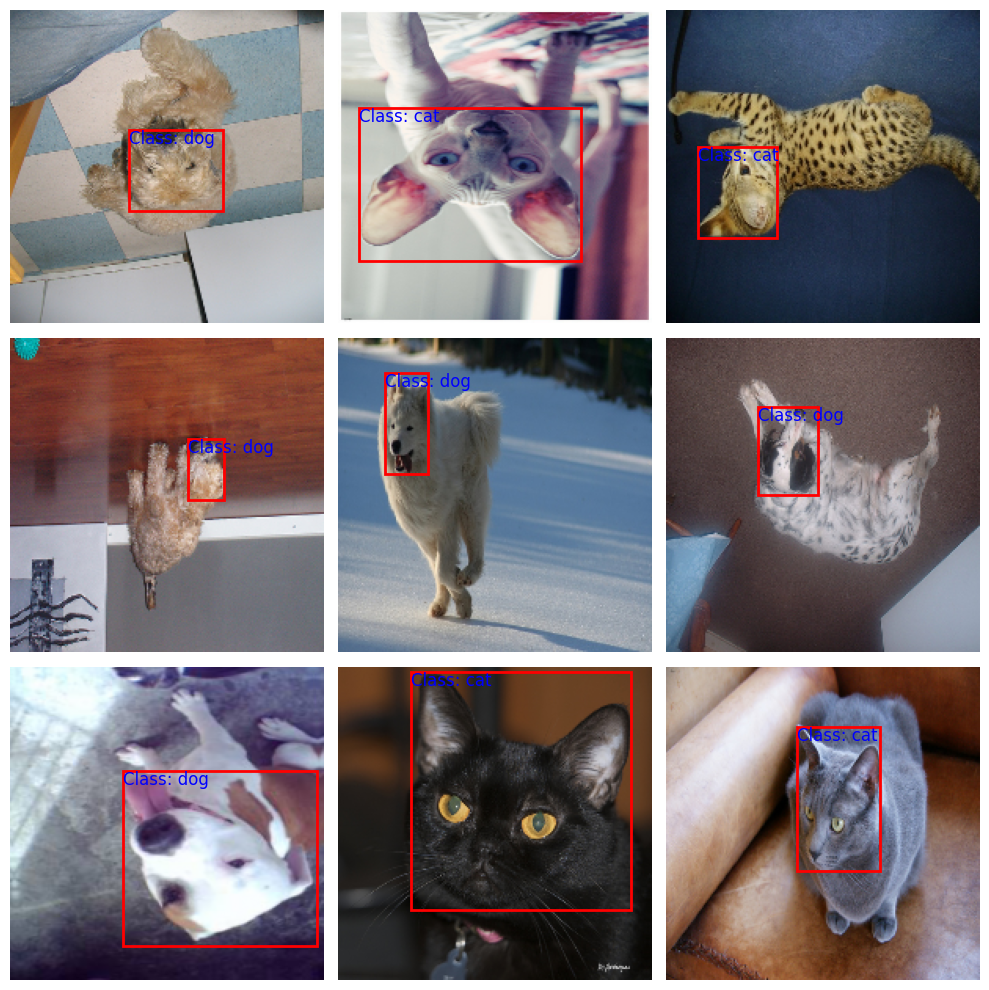

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Define the number of images to plot
num_images = 9

# Define the figure and axes for subplots
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes = axes.flatten()

# Iterate over the images in the dataset
for i in range(num_images):
    image, annotation = dataset[i]
    boxes = annotation['boxes']
    labels = annotation['labels']

    # Plot the image
    axes[i].imshow(image.permute(1, 2, 0))
    axes[i].axis('off')

    # Plot the bounding boxes with class labels
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin

        # Create a Rectangle patch
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')

        # Add the patch to the plot
        axes[i].add_patch(rect)

        # Add the class label text
        class_label = f'Class: {classes[label.item()]}'
        axes[i].text(xmin, ymin, class_label, fontsize=12, verticalalignment='top', color='b')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


##**Further processing the data**
It's better to have more insights on the data before directly procced for training, so following steps include, checking size of dats and number of entries in each class, handling bias, splitting the data.

###**Checking class size and count class**
checking the size and count of ouccurenses will help us to know about what ratios we need to split, anf if data needed any augumentations to increase the data and so on...

In [ ]:
# Print the size of the dataset
def data_count(dataset):
    dataset_size = len(dataset)
    print(f"Dataset size: {dataset_size}")

    # Count the occurrences of each class in the dataset
    class_counts = {class_label: 0 for class_label in range(len(classes))}
    for _, annotation in dataset:
        labels = annotation['labels']
        for label in labels.tolist():
            class_counts[label] += 1

    # Print the count of each class
    for class_label, count in class_counts.items():
        print(f"Class {classes[class_label]}: {count}")
data_count(dataset)


Dataset size: 3686
Class __background__: 0
Class dog: 2498
Class cat: 1189


###**Spliting the Dataset**
dataset is splitted 70 %for training, 15% testing and remaining for validating

In [ ]:
from sklearn.model_selection import train_test_split

# Split the dataset into training, validating and testing sets
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15
train_dataset, val_test_data = train_test_split(dataset, train_size=train_ratio, test_size=1 - train_ratio, random_state=42)
val_data, test_dataset = train_test_split(val_test_data, test_size=test_ratio/(test_ratio + val_ratio), random_state=42)

In [ ]:
data_count(train_dataset)

Dataset size: 2580
Class __background__: 0
Class dog: 1759
Class cat: 821


###**Handling the class imbalance and loading the data**
As we can se one of the classes is about double to the other in the training dataset, which could effect the model performece. In simple terms the model get biased towards the class with more samples, for example: for above dataset 68% of data belongs to class dog and rmaining belongs cat, so the model goes biased towards class dog(if model will predict class dog for enire dataset, this alone give the model accuracy 67% even without predicting class cat at all) and model might end up stucking at local loop.

I choose to handle this issue by oversampling the class cat while loading train daaset to dataloader, I have done it by calcialting frequency of each class and applying to sampler while loading.

In [ ]:
from torch.utils.data.sampler import WeightedRandomSampler

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

def calculate_class_weights(dataset):
    # Get all the class labels from the dataset
    all_labels = []
    for data in dataset:
        targets = data[1]  # Access the targets dictionary
        labels = targets['labels']  # Access the labels tensor
        all_labels.extend(labels.tolist())

    # Calculate class frequencies
    class_counts = torch.bincount(torch.tensor(all_labels))

    # Calculate inverse class frequencies
    class_weights = 1.0 / class_counts.float()
    class_weights[0] = 0
    class_weights = class_weights / torch.sum(class_weights)

    return class_weights

class_weights = calculate_class_weights(train_dataset)
sampler = WeightedRandomSampler(weights=class_weights,
                                num_samples=len(train_dataset),
                                replacement=True)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, collate_fn=collate_fn, sampler=sampler)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=16, shuffle=False, collate_fn=collate_fn)

# Print the sizes of the training and testing sets
print('Size of the training set:', len(train_dataset))
print('Size of the validation set:', len(val_data))
print('Size of the testing set:', len(test_dataset))



Size of the training set: 2580
Size of the validation set: 553
Size of the testing set: 553


##**Loading the Model**
I have used the the pretrained model: Faster RCNN with resnet 50 as background
I have set the arugument `pretrained = True`, so the that model will be finetuned


In [ ]:
import torch
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def create_model(num_classes):

    # load Faster RCNN pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

    # get the number of input features
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # define a new head for the detector with required number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model
model = create_model(len(classes))
# Define the optimizer and learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.001,  weight_decay=0.0005, momentum=0.9)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

##**Training and Validating**


In [ ]:
from torchvision.ops import box_iou
from tqdm.auto import tqdm



# Define the training and testing functions
def train(model, train_loader, optimizer, epoch):
    model.train()
    total_loss = 0
    prog_bar = tqdm(train_loader, total=len(train_loader))

    #performin the SGD optimization on each batch i.e. 4
    for i, (images, targets) in enumerate(prog_bar):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        #setting the gradient to 0
        optimizer.zero_grad()
        outputs = model(images, targets) #Passing the inputs to the modell
        losses = sum(loss for loss in outputs.values()) #calculating the loss for this batch

        loss_value = losses.item()
        losses.backward() #back propagating
        optimizer.step()

        total_loss += loss_value
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    avg_loss = total_loss / len(val_loader)
    return avg_loss

def validate(model, val_loader, epoch):
    total_loss = 0
    prog_bar = tqdm(val_loader, total=len(val_loader))

    with torch.no_grad():
        for i, (images, targets) in enumerate(prog_bar):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)

            losses = sum(loss for loss in loss_dict.values())
            loss_value = losses.item()
            total_loss += loss_value
            prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    avg_loss = total_loss / len(val_loader)

    return avg_loss

I choose to train with 3 epochs, and kepping the loss as metrics

In [ ]:
checkpoint_dir = "/content/drive/MyDrive/rcnn/checkpoint_dir"
num_epochs = 3
train_hist = []
val_hist = []
for epoch in range(num_epochs):
    train_loss = train(model, train_loader, optimizer, epoch)
    val_loss = validate(model, val_loader, epoch)
    train_hist.append(train_loss)
    val_hist.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f} - Validation Loss: {val_loss}")
    #saving mdoel checkpoints just incase
    # checkpoint_path = f'{checkpoint_dir}/checkpoint{epoch}.pth'
    # torch.save({
    #     'epoch': epoch,
    #     'model_state_dict': model.state_dict(),
    #     'optimizer_state_dict': optimizer.state_dict(),
    # }, checkpoint_path)
# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/rcnn/model.pth')


  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1/3 - Train Loss: 1.1202 - Validation Loss: 0.1791477326835905


  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2/3 - Train Loss: 0.7098 - Validation Loss: 0.1359716004558972


  0%|          | 0/162 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3/3 - Train Loss: 0.5736 - Validation Loss: 0.11918078341654369


##**Plotting the Loss**

Below I have plotted the graph of loss history for both training and validation

This will give us the insights of wether the model is overfitting or underfitting, and also we can check what epoch it did best.
From below we can obsrve that validation curve is stable, so model can is good to go

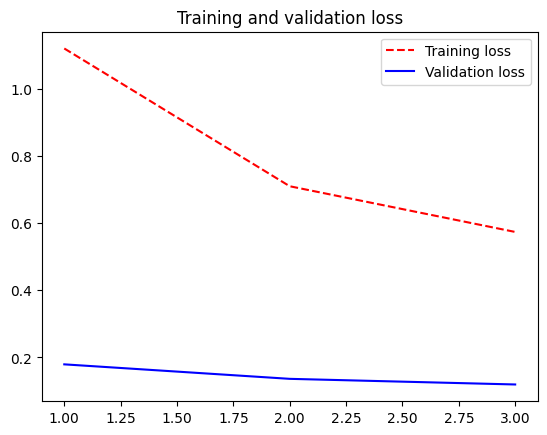

In [ ]:
loss = train_hist
val_loss = val_hist
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r--', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

##**Model Evaludation**
Below I evaluated the model on test data, and Calculated the IoU of predicted bounding box with ground truth, and with iou threshold as 0.5, I have calculated precision, accuracy and f1 scores, and also calculated prediction of bounding boxes with threshold 0.8, which is 87%.

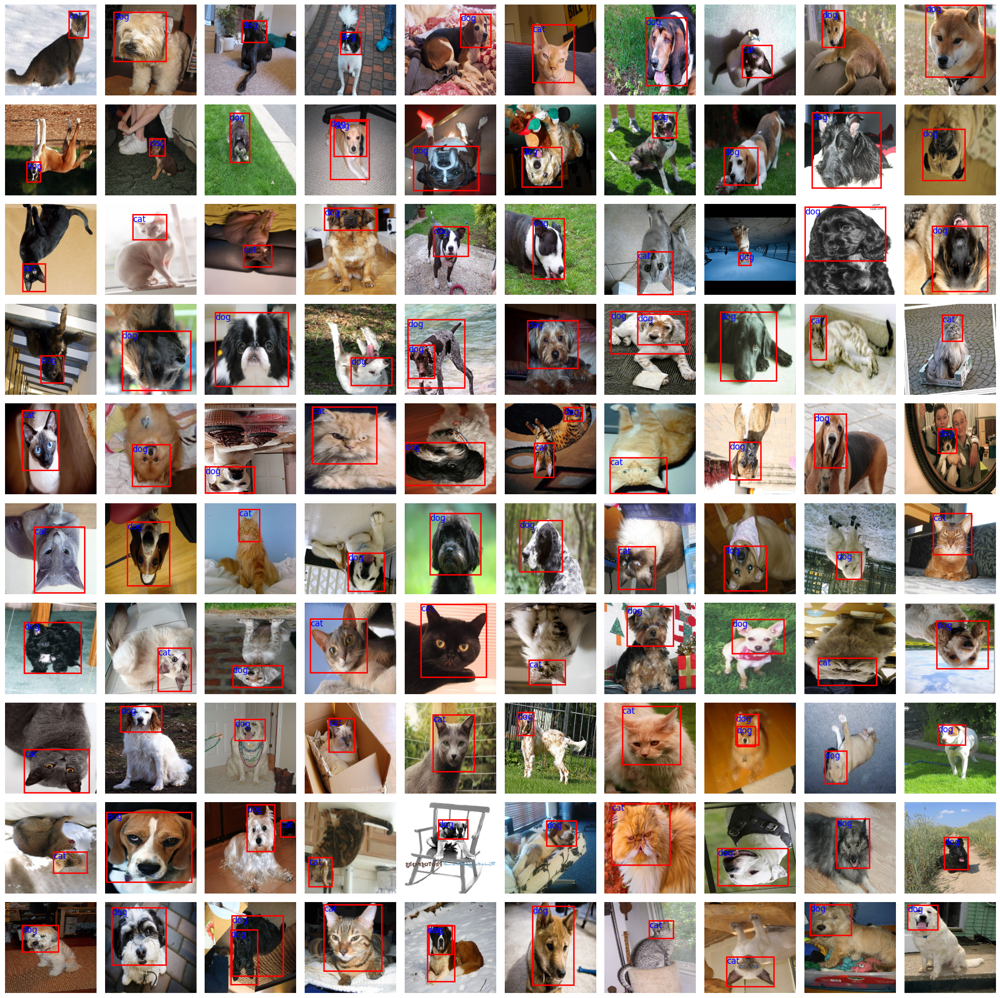

Precision: 0.9871794871794872
Recall: 0.9705882352941176
F1 Score: 0.9788135593220338
Accuracy of predicting bounding box: 87.1609403254973%


In [ ]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def calculate_iou(box1, box2):
    # Calculate the coordinates of the intersection rectangle
    x_min = max(box1[0], box2[0])
    y_min = max(box1[1], box2[1])
    x_max = min(box1[2], box2[2])
    y_max = min(box1[3], box2[3])

    # Calculate the intersection area
    intersection_width = torch.clamp(x_max - x_min, min=0)
    intersection_height = torch.clamp(y_max - y_min, min=0)
    intersection_area = intersection_width * intersection_height

    # Calculate the union area
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - intersection_area

    # Calculate the IoU
    iou = intersection_area / union_area

    return iou

true_positives = 0
false_positives = 0
false_negatives = 0
stopper = 0
detection_threshold = 0.8
total_inputs = 0
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()
i = 0
model.eval()
for images, targets  in test_dataset:
    total_inputs += 1
    image = torch.unsqueeze(images, 0)
    with torch.no_grad():
        outputs = model(image.to(device))

    # load all detection to CPU for further operations
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # carry further only if there are detected boxes
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data
        scores = outputs[0]['scores'].data
        labels = outputs[0]['labels'].data
        # filter out boxes according to `detection_threshold`
        boxes = boxes[scores >= detection_threshold]
        predicted_labels = labels[scores >= detection_threshold]
        if len(boxes) > 0:
            target_boxes = targets['boxes']
            target_labels = targets['labels']
            iou = calculate_iou(boxes[0], target_boxes[0])
            if iou >= 0.5 and predicted_labels[0] == target_labels[0]:
                true_positives += 1
            elif iou < 0.5 and predicted_labels[0] == target_labels[0]:
                false_negatives += 1
            elif iou >= 0.5 and predicted_labels[0] != target_labels[0]:
                    false_positives += 1

            # get all the predicited class names
            pred_classes = [i for i in outputs[0]['labels'].cpu().numpy()]
            i+=1
            if i <= 100:
                axes[i-1].imshow(images.permute(1, 2, 0))
                axes[i-1].axis('off')

                # draw the bounding boxes and write the class name on top of it
                for j, box in enumerate(boxes):
                    class_name = pred_classes[j]
                    xmin, ymin, xmax, ymax = box
                    width = xmax - xmin
                    height = ymax - ymin
                    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')

                    # Add the patch to the plot
                    axes[i-1].add_patch(rect)
                    axes[i-1].text(xmin, ymin, classes[int(class_name.item())], fontsize=12, verticalalignment='top', color='b')



plt.tight_layout()
plt.show()

# calculate and metrics
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")
print(f"Accuracy of predicting bounding box: {i*100/total_inputs}%")

###**Performing Inference on single image**

In [ ]:

from torchvision import transforms

def visualize_prediction(image, boxes, labels, classes):
    # Create figure and axes
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(image)

    # Add bounding boxes to the image
    for box, label in zip(boxes, labels):
        print(box)
        x, y, w, h = box.to('cpu').numpy()
        class_name = classes[label]
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Add label text
        ax.text(x, y, class_name, color='b', fontsize=12, weight='bold')

    # Show the plot
    plt.show()

def inference(image, threshold = 0.5):
    image = Image.open(image)
    image = image.convert("RGB")
    image = image.resize((200, 200))
    image_tensor = transforms.ToTensor()(image)
    image_tensor = image_tensor.unsqueeze(0).to(device)

    # Perform inference on the image
    model.eval()
    with torch.no_grad():
        predictions = model(image_tensor)

    # Extract the predicted boxes and labels from the predictions
    predicted_boxes = predictions[0]['boxes'].data
    predicted_labels = predictions[0]['labels'].data
    scores = predictions[0]['scores'].data
    predicted_labels = predicted_labels[scores >= threshold]
    predicted_boxes = predicted_boxes[scores >= threshold]
    if len(predicted_labels)!= 0:
        # Visualize the image with predicted bounding boxes
        visualize_prediction(image, predicted_boxes, predicted_labels, classes)
    else:
        print(f"model didn't predicted on this image with confidence {threshold}")

tensor([ 35.2113,  48.2946, 155.5907, 117.9480])


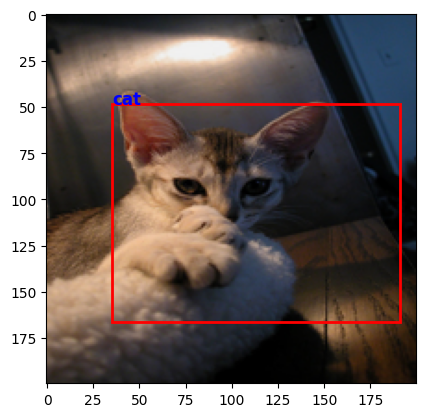

In [ ]:
inference("/content/oxfordiiit-prt/images/images/Abyssinian_10.jpg", 0.8)